### Import and Install Libraries


In [1]:
# Install Libraries (Install if needed)
!apt-get install -y tesseract-ocr
!pip install pytesseract
!pip install torch torchvision transformers tqdm
!pip install tqdm
!pip install tensorflow matplotlib opencv-python-headless
!pip install easyocr
!pip install detectron2
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install pyarrow
!pip install fastparquet
!pip install datasets
!pip install evaluate
!pip install jiwer

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-bvp0jybi
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-bvp0jybi
  Resolved https://github.com/facebookresearch/detectron2.git to commit c69939aa85460e8135f40bce908a6cddaa73065f
  Preparing metadata (setup.py) ... done


In [30]:
# --- SYSTEM AND FILE HANDLING ---
import os
import random
from zipfile import ZipFile
from shutil import copyfile

# --- DATA MANIPULATION ---
import json
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# --- IMAGE PROCESSING ---
import cv2
from PIL import Image, ImageStat
import pytesseract

# --- DATA VISUALIZATION ---
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from tqdm import tqdm

# --- DEEP LEARNING LIBRARIES ---
import torch
from torch.utils.data import DataLoader
from torchvision.transforms import Compose, Resize, ToTensor

# --- HUGGING FACE TRANSFORMERS ---
from transformers import (
    TrOCRProcessor,
    VisionEncoderDecoderModel,
    Seq2SeqTrainer,
    Seq2SeqTrainingArguments,
    AdamW,
    get_scheduler,
)
from datasets import Dataset, DatasetDict
import evaluate  # Correctly replace load_metric

# --- WARNINGS SUPPRESSION ---
import warnings
warnings.filterwarnings("ignore")

### Collect and Load Data

In [3]:
# --- MOUNT GOOGLE DRIVE ---
from google.colab import drive

print("Mounting Google Drive...")
drive.mount('/content/drive')

google_drive_path = "/content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/"
print("Available files:", os.listdir(google_drive_path))

Mounting Google Drive...
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Available files: ['TextOCR Dataset.zip', 'TextOCR Dataset.zip (Unzipped Files)', 'TextOCR_test_Images_filtered_preprocessed.zip', 'TextOCR_test_Images_filtered.zip']


### Understanding Data

In [4]:
# Correct path to the dataset
google_drive_zip_path = "/content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip"
unzipped_folder = "/content/unzipped_dataset"


def unzip_dataset(zip_path, extract_to):
    if os.path.exists(zip_path):
        print(f"Extracting dataset from {zip_path}...")

        # Open the zip file
        with ZipFile(zip_path, 'r') as zip_ref:
            # Get the list of files to extract
            file_list = zip_ref.namelist()

            # Create a progress bar for extraction
            for file in tqdm(file_list, desc="Extracting", unit="file"):
                zip_ref.extract(file, extract_to)

        print(f"Dataset extracted to {extract_to}")
    else:
        raise FileNotFoundError(f"Zip file not found at {zip_path}")


# Unzip the dataset with progress bar
unzip_dataset(google_drive_zip_path, unzipped_folder)

# List the unzipped dataset
print("\n----- Top Level Files -----")
!ls /content/unzipped_dataset

# Optionally, find all directories within the unzipped dataset
print("\n----- Dataset Directory -----")
!find /content/unzipped_dataset -type d

Extracting dataset from /content/drive/My Drive/Colab Notebooks/AAI-521-Computer Vision Dataset/TextOCR Dataset.zip...


Extracting: 100%|██████████| 25124/25124 [00:51<00:00, 484.38file/s]


Dataset extracted to /content/unzipped_dataset

----- Top Level Files -----
annot.csv  annot.parquet  img.csv  img.parquet	TextOCR_0.1_train.json	train_val_images

----- Dataset Directory -----
/content/unzipped_dataset
/content/unzipped_dataset/train_val_images
/content/unzipped_dataset/train_val_images/train_images


In [5]:
# ~~~~~ Top Level Files ~~~~~ Data Sample
# Correct paths to dataset files and folders
base_path = "/content/unzipped_dataset"
csv_files = [os.path.join(base_path, "annot.csv"), os.path.join(base_path, "img.csv")]
parquet_files = [os.path.join(base_path, "annot.parquet"), os.path.join(base_path, "img.parquet")]
json_file = os.path.join(base_path, "TextOCR_0.1_train.json")
image_folder = os.path.join(base_path, "train_val_images/train_images")

# Prepare a dictionary to store file samples for visualization
file_samples = {}

# Load and collect CSV file samples
for file in csv_files:
    try:
        df = pd.read_csv(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect Parquet file samples
for file in parquet_files:
    try:
        df = pd.read_parquet(file)
        file_samples[file] = df.head()  # Collect first 5 rows
    except Exception as e:
        file_samples[file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect JSON file samples
try:
    with open(json_file, 'r') as f:
        data = json.load(f)
        # Convert first 5 keys and values to DataFrame
        json_sample = {k: data[k] for k in list(data.keys())[:5]}
        file_samples[json_file] = pd.DataFrame.from_dict(json_sample, orient='index', columns=['Value'])
except Exception as e:
    file_samples[json_file] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Load and collect image folder sample
try:
    image_sample = os.listdir(image_folder)[:5]
    file_samples[image_folder] = pd.DataFrame({"Images": image_sample})  # Convert filenames to DataFrame
except Exception as e:
    file_samples[image_folder] = pd.DataFrame({"Error": [str(e)]})  # Collect error as DataFrame

# Display DataFrame contents
for file_path, sample_df in file_samples.items():
    print(f"--- Sample from {file_path} ---")
    print(sample_df)

--- Sample from /content/unzipped_dataset/annot.csv ---
   Unnamed: 0                  id          image_id  \
0           0  a4ea732cd3d5948a_1  a4ea732cd3d5948a   
1           1  a4ea732cd3d5948a_2  a4ea732cd3d5948a   
2           2  a4ea732cd3d5948a_3  a4ea732cd3d5948a   
3           3  a4ea732cd3d5948a_4  a4ea732cd3d5948a   
4           4  a4ea732cd3d5948a_5  a4ea732cd3d5948a   

                            bbox  utf8_string  \
0   [525.83, 3.4, 197.64, 33.94]  Performance   
1  [534.67, 64.68, 91.22, 38.19]        Sport   
2  [626.95, 63.62, 96.52, 31.82]        Watch   
3  [577.4, 141.87, 147.13, 43.1]   ...period.   
4  [391.03, 163.9, 60.82, 38.65]            .   

                                              points     area  
0  [525.83, 3.4, 723.47, 7.29, 722.76, 36.99, 525...  6707.90  
1  [535.73, 64.68, 623.41, 67.51, 625.89, 102.87,...  3483.69  
2  [626.95, 63.62, 721.7, 63.62, 723.47, 95.44, 6...  3071.27  
3  [580.02, 143.61, 724.53, 141.87, 723.66, 184.9...  6341.30 

### Display Data Images

Displaying the first 20 images from the dataset...


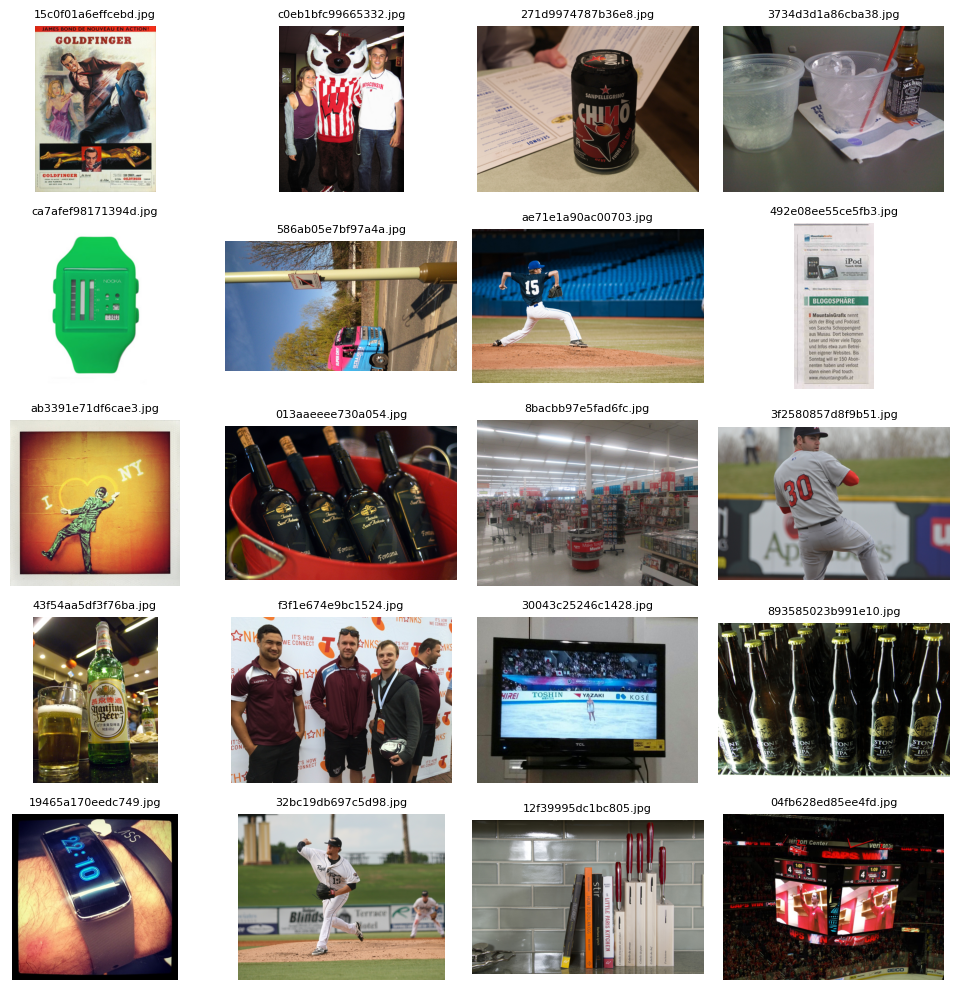

In [6]:
# Update the folder path to the correct image directory
unzipped_folder = "/content/unzipped_dataset/train_val_images/train_images"


def display_sample_images(folder, num_images=20):
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(valid_extensions)]
    image_files = image_files[:num_images]  # Limit to the first `num_images`

    if not image_files:
        print("No images found in the folder.")
        return

    # Display images in a grid
    plt.figure(figsize=(10, 10))
    for i, image_name in enumerate(image_files, start=1):
        image_path = os.path.join(folder, image_name)
        image = cv2.imread(image_path)
        if image is not None:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for display
            plt.subplot(5, 4, i)  # Create a grid of 5 rows and 4 columns
            plt.imshow(image)
            plt.title(image_name, fontsize=8)
            plt.axis('off')
        else:
            print(f"Unable to read image: {image_name}")
    plt.tight_layout()
    plt.show()


# Display the first 20 images
print("Displaying the first 20 images from the dataset...")
display_sample_images(unzipped_folder)

### Data Cleaning

Processing Images: 100%|██████████| 25119/25119 [34:32<00:00, 12.12image/s]



Total images processed: 25119
Total OCR-ready images saved in '/content/test_images': 21266
Total non-OCR-ready images saved in '/content/disposed_images': 3853
Visualizing first 10 OCR-ready images from /content/test_images...


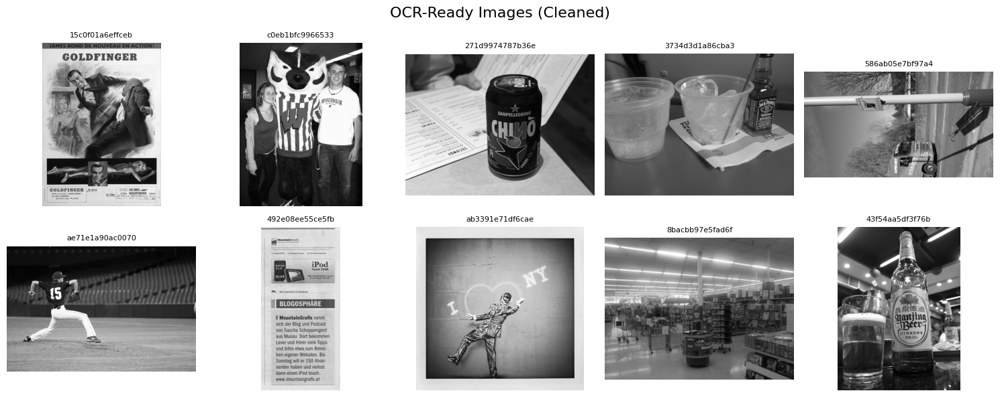

Visualizing first 10 non-OCR-ready images from /content/disposed_images...


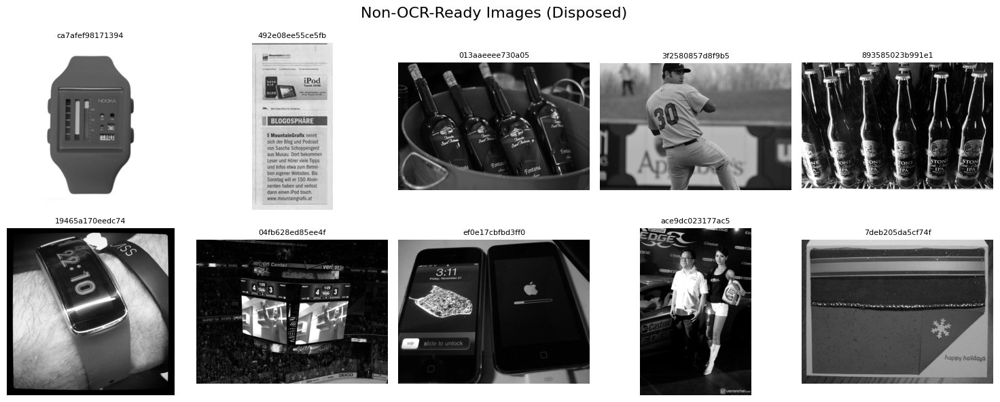

In [7]:
# Thresholds for quality checks
BRIGHTNESS_THRESHOLD = 50
CONTRAST_THRESHOLD = 20
SHARPNESS_THRESHOLD = 100

# Paths for input and output folders
input_folder = "/content/unzipped_dataset/train_val_images/train_images"
ocr_ready_folder = "/content/test_images"  # Folder for OCR-ready images
non_ocr_ready_folder = "/content/disposed_images"  # Folder for non-OCR-ready images
os.makedirs(ocr_ready_folder, exist_ok=True)  # Ensure OCR-ready folder exists
os.makedirs(non_ocr_ready_folder, exist_ok=True)  # Ensure non-OCR-ready folder exists

# Functions for image quality evaluation
def calculate_brightness(image):
    """Calculate brightness of an image."""
    pil_image = Image.fromarray(image)
    stat = ImageStat.Stat(pil_image)
    return stat.mean[0]

def calculate_contrast(image):
    """Calculate contrast of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

def calculate_sharpness(image):
    """Calculate sharpness of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def contains_text(image_path):
    """Check if an image contains text using Tesseract OCR."""
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    text = pytesseract.image_to_string(image)
    return len(text.strip()) > 0

# Function to clean and categorize images
def clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder):
    valid_images = []
    non_ocr_ready_images = []

    for image_name in tqdm(os.listdir(input_folder), desc="Processing Images", unit="image"):
        image_path = os.path.join(input_folder, image_name)
        if not image_name.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff')):
            continue

        # Read and evaluate the image
        image = cv2.imread(image_path)
        if image is None:
            continue  # Skip unreadable images

        try:
            # Calculate quality metrics
            brightness = calculate_brightness(image)
            contrast = calculate_contrast(image)
            sharpness = calculate_sharpness(image)

            # Check if the image meets OCR readiness criteria or contains text
            if (
                brightness >= BRIGHTNESS_THRESHOLD and
                contrast >= CONTRAST_THRESHOLD and
                sharpness >= SHARPNESS_THRESHOLD
            ) or contains_text(image_path):
                # Save OCR-ready image
                copyfile(image_path, os.path.join(ocr_ready_folder, image_name))
                valid_images.append(image_name)
            else:
                # Save non-OCR-ready image
                copyfile(image_path, os.path.join(non_ocr_ready_folder, image_name))
                non_ocr_ready_images.append(image_name)
        except Exception as e:
            print(f"Error processing {image_name}: {e}")

    return valid_images, non_ocr_ready_images

# Function to visualize images in a 2x5 grid
def visualize_images(folder, title, num_images=10):
    """Display images in a 2x5 grid."""
    files = os.listdir(folder)[:num_images]  # Get the first `num_images` files
    rows, cols = 2, 5  # Define grid dimensions
    plt.figure(figsize=(15, 6))
    for i, file in enumerate(files, 1):
        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
        if img is not None:
            plt.subplot(rows, cols, i)
            plt.imshow(img, cmap='gray')
            plt.title(file[:15], fontsize=8)  # Truncate file names for readability
            plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Run the cleaning process
ocr_ready_images, non_ocr_ready_images = clean_images(input_folder, ocr_ready_folder, non_ocr_ready_folder)

# Summary of results
print(f"\nTotal images processed: {len(os.listdir(input_folder))}")
print(f"Total OCR-ready images saved in '{ocr_ready_folder}': {len(ocr_ready_images)}")
print(f"Total non-OCR-ready images saved in '{non_ocr_ready_folder}': {len(non_ocr_ready_images)}")

# Visualize OCR-ready images
print(f"Visualizing first 10 OCR-ready images from {ocr_ready_folder}...")
visualize_images(ocr_ready_folder, title="OCR-Ready Images (Cleaned)")

# Visualize Non-OCR-ready images
print(f"Visualizing first 10 non-OCR-ready images from {non_ocr_ready_folder}...")
visualize_images(non_ocr_ready_folder, title="Non-OCR-Ready Images (Disposed)")

*These images have undergone cleaning, retaining their grayscale format while preserving clarity and essential details for text recognition.*

### Image Preprocessing

**Note:** <i>Images came out too dark. Reduce the sharpen effect to reduce Noise. Limit rotation angle. Certain vertical images were rotating horizontally that weren't suppose to. Adjustments were made </i>

Preprocessing images...


Preprocessing Images: 100%|██████████| 21266/21266 [11:09<00:00, 31.75image/s]


Preprocessing complete. Preprocessed images are saved in '/content/preprocessed_images'.
Displaying first 10 preprocessed images from /content/preprocessed_images...


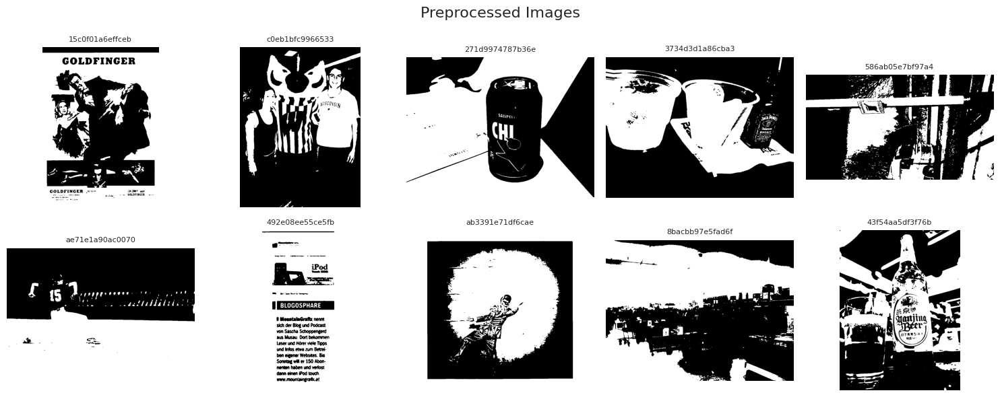

In [13]:
# Input folder for preprocessing (use OCR-ready folder from cleaning step)
input_folder = ocr_ready_folder  # OCR-ready folder from cleaning
output_folder = "/content/preprocessed_images"  # Folder for preprocessed images
os.makedirs(output_folder, exist_ok=True)  # Ensure preprocessed folder exists

def preprocess_image(image_path, output_path):
    """Preprocess the image by converting to grayscale, applying Gaussian blur, binarization, deskewing, and sharpening."""
    # Load the image
    image = cv2.imread(image_path)

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Gaussian Blur for noise reduction
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Apply Otsu's Thresholding for binarization
    _, binary = cv2.threshold(blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

    # Deskew the image (limit angle correction to small deviations)
    coords = np.column_stack(np.where(binary > 0))
    angle = cv2.minAreaRect(coords)[-1]
    if angle < -45:
        angle = -(90 + angle)
    elif abs(angle) > 15:  # Prevent large rotations
        angle = 0
    else:
        angle = -angle

    # Rotate the image to deskew
    (h, w) = binary.shape[:2]
    center = (w // 2, h // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle, 1.0)
    deskewed = cv2.warpAffine(binary, rotation_matrix, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)

    # Sharpen the image
    kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]])
    sharpened = cv2.filter2D(deskewed, -1, kernel)

    # Save the preprocessed image
    cv2.imwrite(output_path, sharpened)

# Get the list of image files with valid extensions
image_files = [f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.tiff'))]

# Preprocess each image
print("Preprocessing images...")
for filename in tqdm(image_files, desc="Preprocessing Images", unit="image"):
    input_path = os.path.join(input_folder, filename)
    output_path = os.path.join(output_folder, filename)
    preprocess_image(input_path, output_path)

print(f"Preprocessing complete. Preprocessed images are saved in '{output_folder}'.")

# Visualize Preprocessed Images
def visualize_images(folder, title, num_images=10):
    """Display images in a 2x5 grid."""
    files = os.listdir(folder)[:num_images]
    rows, cols = 2, 5  # Adjust grid dimensions
    plt.figure(figsize=(15, 6))
    for i, file in enumerate(files, 1):
        img_path = os.path.join(folder, file)
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        if img is not None:
            plt.subplot(rows, cols, i)
            plt.imshow(img, cmap='gray')
            plt.title(file[:15], fontsize=8)  # Truncate file names for readability
            plt.axis('off')
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Display 10 preprocessed images
print(f"Displaying first 10 preprocessed images from {output_folder}...")
visualize_images(output_folder, title="Preprocessed Images")

*The preprocessed images show a stark binary appearance, emphasizing high contrast regions, which can enhance text visibility but may obscure fine details in complex backgrounds. This approach is beneficial for OCR tasks but could struggle with subtle or low-contrast text.*

### Exploratory Data Analysis

Starting EDA...


Analyzing Images: 100%|██████████| 19856/19856 [04:34<00:00, 72.43image/s]


EDA results saved to /content/eda_results.csv
Summary Statistics:
         Brightness      Contrast     Sharpness         Width        Height  \
count  19856.000000  19856.000000  19856.000000  19856.000000  19856.000000   
mean     126.451876    117.093809   6109.881859    946.850876    810.411916   
std       48.177121     13.808318   3657.175102    141.761499    156.002788   
min        0.784935      1.863178     39.530719    256.000000    257.000000   
25%       91.605017    113.325296   3605.387794    939.000000    683.000000   
50%      123.888773    122.628498   5397.736528   1024.000000    768.000000   
75%      160.239267    126.316897   7765.441137   1024.000000   1024.000000   
max      254.985037    127.487515  80042.355850   2560.000000   3008.000000   

       Aspect Ratio  
count  19856.000000  
mean       1.235488  
std        0.364352  
min        0.250000  
25%        0.997070  
50%        1.333333  
75%        1.499268  
max        3.984436  


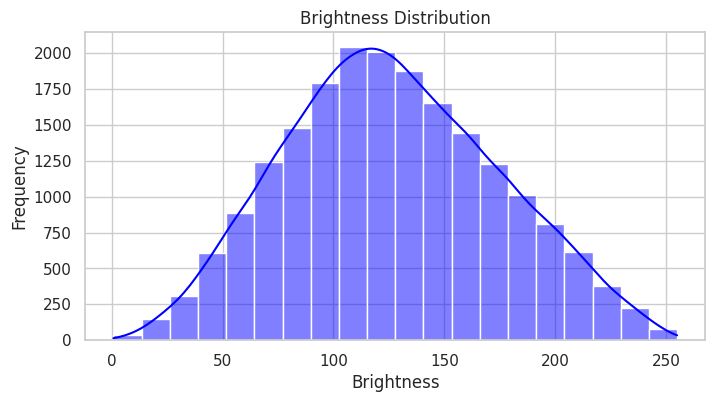

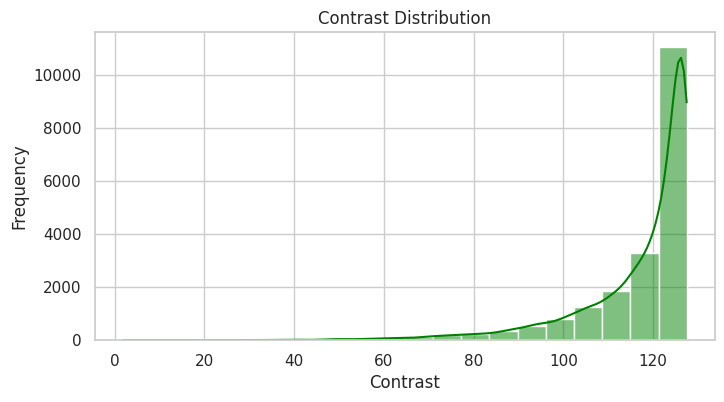

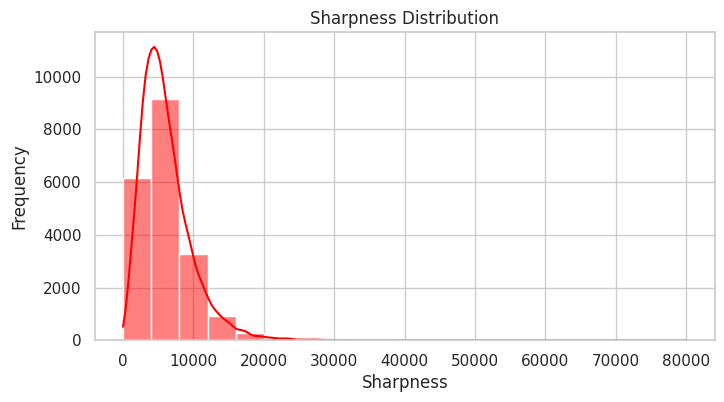

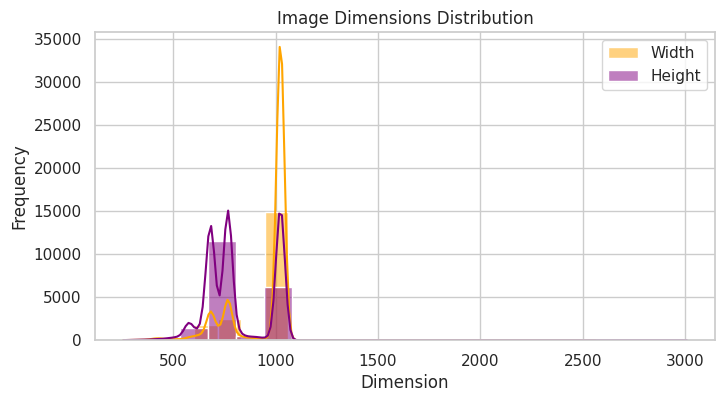

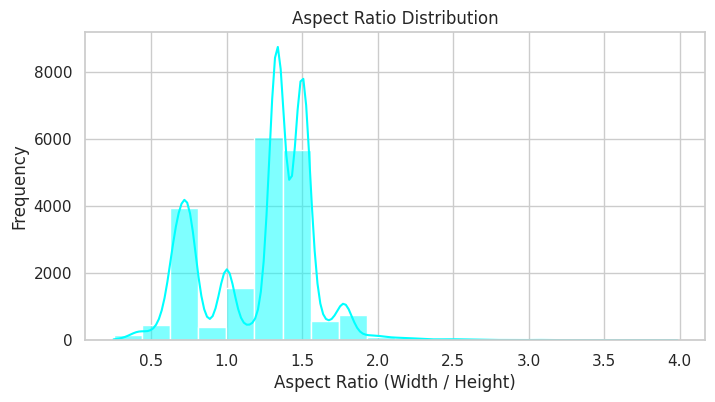

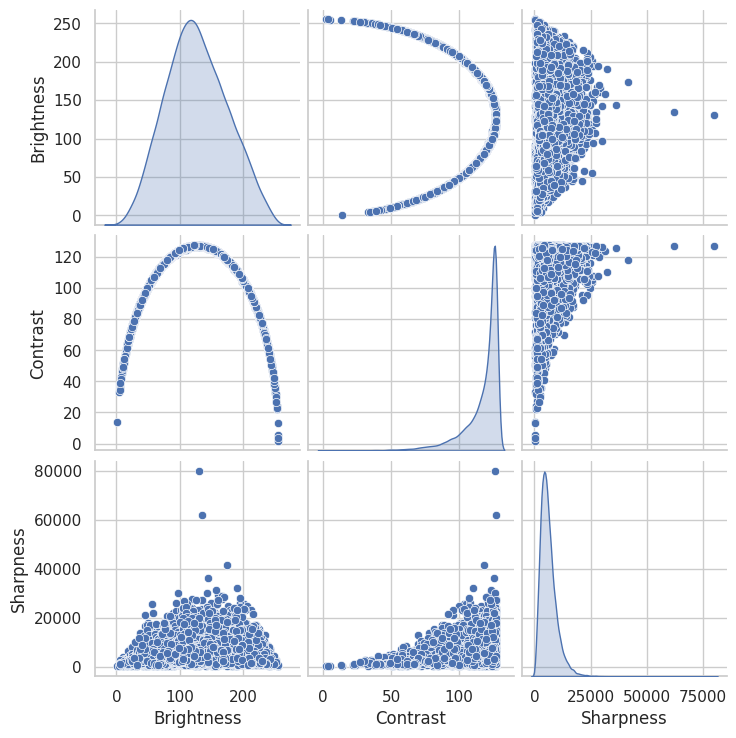

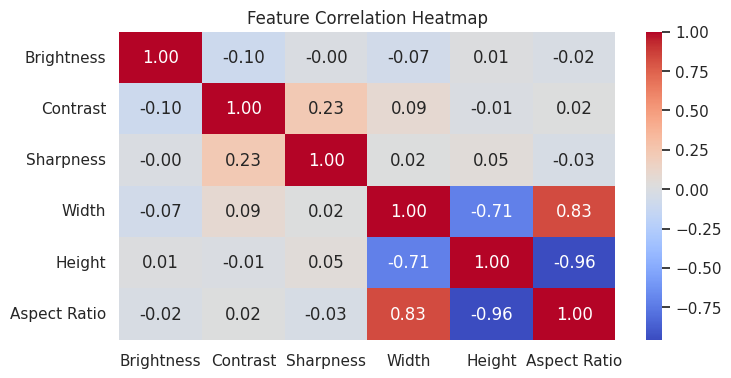

In [9]:
# Paths
preprocessed_folder = "/content/output_images"  # Folder with preprocessed images
output_csv = "/content/eda_results.csv"  # CSV to save EDA results

# Helper functions for feature extraction
def calculate_brightness(image):
    """Calculate brightness of an image."""
    image = Image.fromarray(image)
    stat = ImageStat.Stat(image)
    return stat.mean[0]

def calculate_contrast(image):
    """Calculate contrast of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    return gray.std()

def calculate_sharpness(image):
    """Calculate sharpness of an image."""
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    laplacian = cv2.Laplacian(gray, cv2.CV_64F).var()
    return laplacian

# Process preprocessed images and extract features
def process_images_for_eda(folder):
    """Extract brightness, contrast, and sharpness for all valid images."""
    data = []
    valid_extensions = ('.png', '.jpg', '.jpeg', '.bmp', '.tiff')
    image_files = [f for f in os.listdir(folder) if f.lower().endswith(valid_extensions)]

    # Add progress bar for processing
    for image_name in tqdm(image_files, desc="Analyzing Images", unit="image"):
        image_path = os.path.join(folder, image_name)

        # Read image
        image = cv2.imread(image_path)
        if image is None:
            print(f"Unreadable image file: {image_name}")
            continue

        # Extract features
        try:
            brightness = calculate_brightness(image)
            contrast = calculate_contrast(image)
            sharpness = calculate_sharpness(image)
            height, width = image.shape[:2]
            data.append({
                "Image": image_name,
                "Brightness": brightness,
                "Contrast": contrast,
                "Sharpness": sharpness,
                "Width": width,
                "Height": height,
                "Aspect Ratio": width / height if height > 0 else None
            })
        except Exception as e:
            print(f"Error processing image {image_name}: {e}")

    return pd.DataFrame(data)

# Extract features from preprocessed images
print("Starting EDA...")
df = process_images_for_eda(preprocessed_folder)

# Save EDA results and perform visualizations
if not df.empty:
    # Save results to CSV
    df.to_csv(output_csv, index=False)
    print(f"EDA results saved to {output_csv}")

    # Summary statistics
    print("Summary Statistics:")
    print(df.describe())

    # Visualizations
    sns.set(style="whitegrid")

    # Brightness Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Brightness"], bins=20, kde=True, color="blue")
    plt.title("Brightness Distribution")
    plt.xlabel("Brightness")
    plt.ylabel("Frequency")
    plt.show()

    # Contrast Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Contrast"], bins=20, kde=True, color="green")
    plt.title("Contrast Distribution")
    plt.xlabel("Contrast")
    plt.ylabel("Frequency")
    plt.show()

    # Sharpness Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Sharpness"], bins=20, kde=True, color="red")
    plt.title("Sharpness Distribution")
    plt.xlabel("Sharpness")
    plt.ylabel("Frequency")
    plt.show()

    # Image Dimensions Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Width"], bins=20, kde=True, color="orange", label="Width")
    sns.histplot(df["Height"], bins=20, kde=True, color="purple", label="Height")
    plt.title("Image Dimensions Distribution")
    plt.xlabel("Dimension")
    plt.ylabel("Frequency")
    plt.legend()
    plt.show()

    # Aspect Ratio Distribution
    plt.figure(figsize=(8, 4))
    sns.histplot(df["Aspect Ratio"], bins=20, kde=True, color="cyan")
    plt.title("Aspect Ratio Distribution")
    plt.xlabel("Aspect Ratio (Width / Height)")
    plt.ylabel("Frequency")
    plt.show()

    # Pairplot for relationships
    sns.pairplot(df, vars=["Brightness", "Contrast", "Sharpness"], diag_kind="kde")
    plt.show()

    # Correlation Heatmap
    plt.figure(figsize=(8, 4))
    corr = df[["Brightness", "Contrast", "Sharpness", "Width", "Height", "Aspect Ratio"]].corr()
    sns.heatmap(corr, annot=True, cmap="coolwarm", fmt=".2f")
    plt.title("Feature Correlation Heatmap")
    plt.show()
else:
    print("No valid images processed. Ensure the preprocessed folder contains valid image files.")

<i>The **brightness** distribution shows a near-normal spread, indicating consistent lighting. **Contrast** peaks near the maximum range, aiding text-background distinction. **Sharpness** is positively skewed, with most images moderately sharp and a few outliers. **Dimensions** are uniform, with width and height clustered tightly, ensuring preprocessing consistency. The **aspect ratio** is concentrated between 1.0 and 1.5, reflecting rectangular shapes ideal for text recognition.

The **Pair Plot** reveals a normal brightness distribution, while contrast and sharpness are skewed with some high-value outliers. The **Heatmap** shows that brightness operates independently, while contrast and sharpness are positively correlated. The aspect ratio strongly correlates with width and height, emphasizing the importance of proportional resizing.</i>

### Visualize Annotations on Images

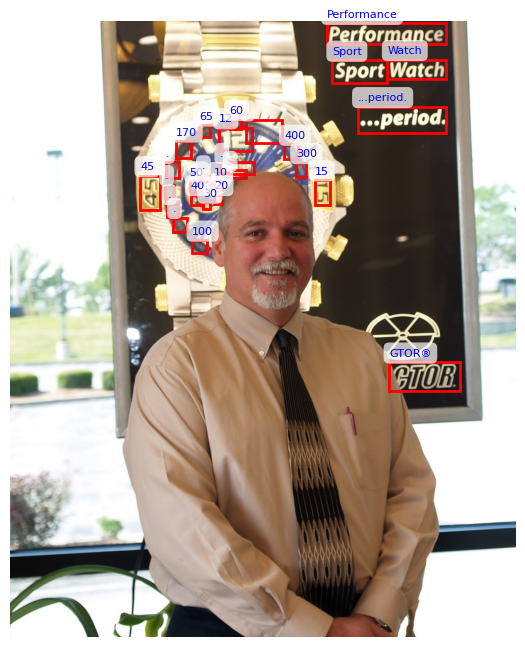

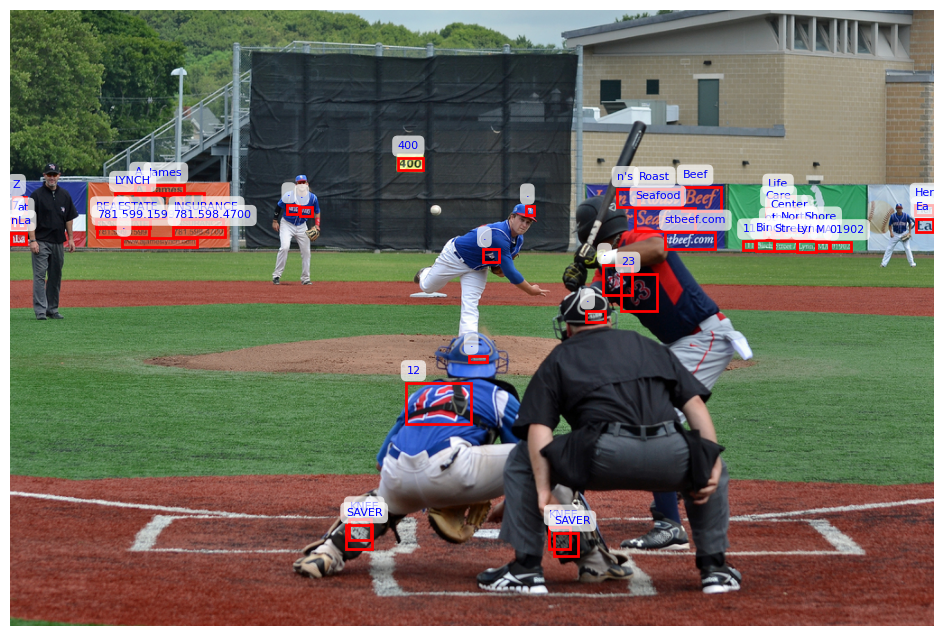

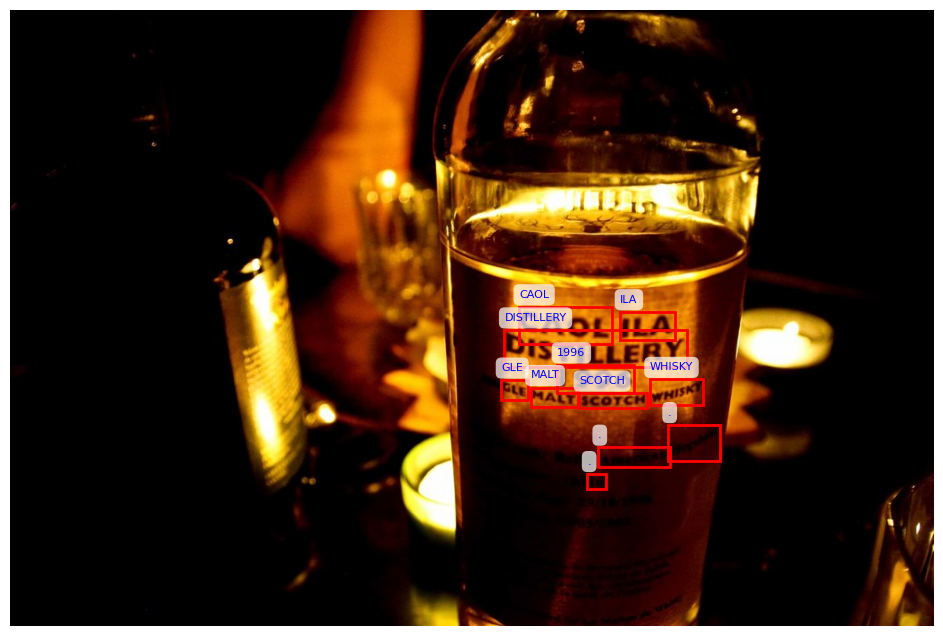

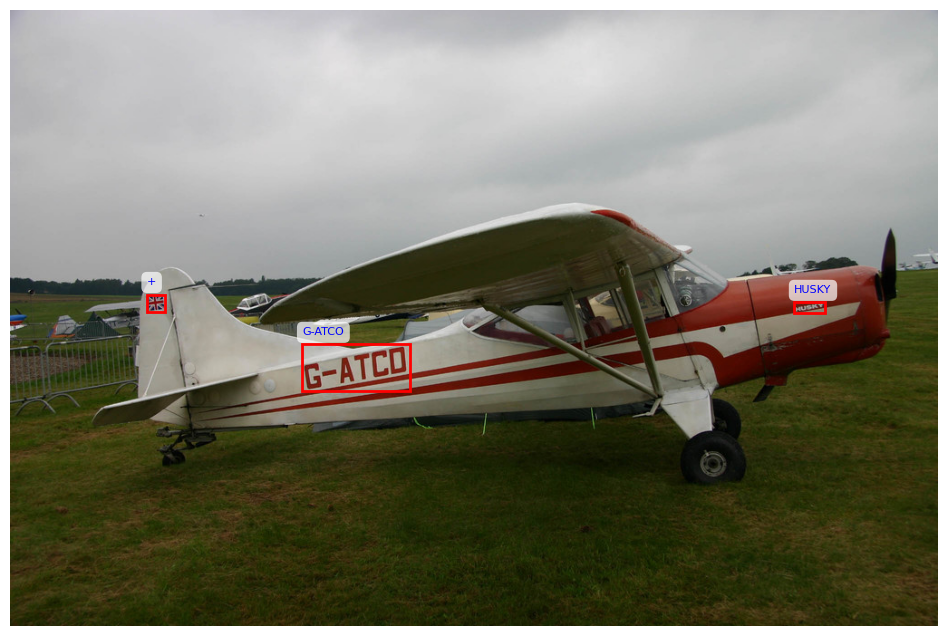

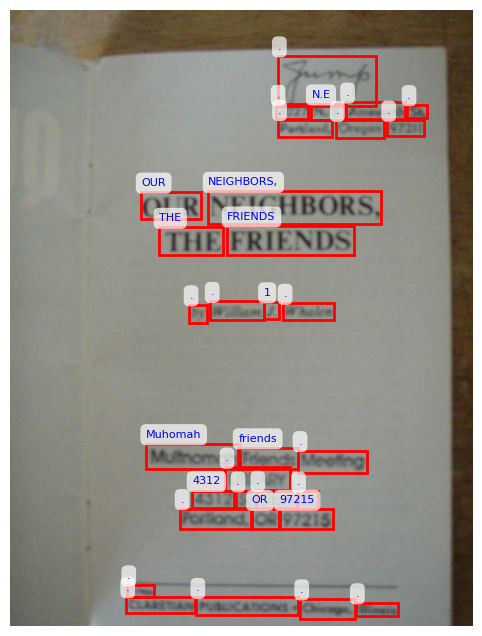

In [10]:
# Function to visualize annotations on images
def visualize_annotations(image_path, annotations):
    """
    Display image with bounding boxes and annotations.
    """
    if not os.path.exists(image_path):
        print(f"Image not found: {image_path}")
        return

    # Load the image using matplotlib
    image = plt.imread(image_path)

    # Create a figure and axis
    fig, ax = plt.subplots(1, figsize=(12, 8))
    ax.imshow(image)

    # Loop through the annotations and add bounding boxes and text
    for ann in annotations:
        bbox = ann['bbox']  # Bounding box: [x, y, width, height]
        text = ann['utf8_string']  # Text annotation

        # Create a rectangle for the bounding box
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3],
            linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Display the text
        ax.text(
            bbox[0], bbox[1] - 10, text, color="blue", fontsize=8,
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', boxstyle='round,pad=0.5')
        )

    plt.axis('off')  # Turn off axis labels
    plt.show()


# Example usage: Loop through the first 5 images
for img_id, metadata in list(data["imgs"].items())[:5]:  # Adjust range as needed
    img_path = os.path.join(
        '/content/unzipped_dataset/train_val_images/train_images',
        metadata["file_name"]
    )

    # Adjust path if there is an extra "train/" subdirectory
    if img_path.startswith("/content/unzipped_dataset/train_val_images/train_images/train/"):
        img_path = img_path.replace("/train_val_images/train_images/train/", "/train_val_images/train_images/")

    # Check if the image exists
    if os.path.exists(img_path):
        annotations = [data["anns"][ann_id] for ann_id in data["imgToAnns"].get(img_id, [])]
        visualize_annotations(img_path, annotations)
    else:
        print(f"Image not found: {img_path}")

*The two images visualize ground truth annotations from the dataset, showcasing bounding boxes and corresponding text labels overlaid directly onto the original images. These annotations highlight the dataset's textual regions, providing key references for model training and evaluation.*

### TrOCR Model
Resize Images to fit TrOCR Model

In [11]:
# Paths
output_folder = "/content/output_images"  # Folder with preprocessed images
resized_folder = "/content/resized_images"  # Folder for resized images
os.makedirs(resized_folder, exist_ok=True)  # Ensure resized folder exists

# Resize dimensions
RESIZE_DIM = (384, 384)

def resize_image(img_path, output_folder):
    """Check image readability and resize to specified dimensions."""
    image = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        return None, None  # Skip unreadable images

    original_size = image.shape  # Original dimensions
    resized_image = Image.open(img_path).convert("RGB").resize(RESIZE_DIM)  # Resize using PIL
    resized_image.save(os.path.join(output_folder, os.path.basename(img_path)))  # Save resized image

    return original_size, resized_image.size

# Process and resize first 5 images
print("Processing and resizing images...")
for file in os.listdir(output_folder)[:5]:
    img_path = os.path.join(output_folder, file)
    original_size, resized_size = resize_image(img_path, resized_folder)
    if original_size and resized_size:
        print(f"Image: {file} | Original Size: {original_size} | Resized Size: {resized_size}")

print(f"Resized images are saved in '{resized_folder}'.")

Processing and resizing images...
Image: 15c0f01a6effcebd.jpg | Original Size: (1024, 742) | Resized Size: (384, 384)
Image: c0eb1bfc99665332.jpg | Original Size: (1024, 768) | Resized Size: (384, 384)
Image: 271d9974787b36e8.jpg | Original Size: (766, 1024) | Resized Size: (384, 384)
Image: 3734d3d1a86cba38.jpg | Original Size: (768, 1024) | Resized Size: (384, 384)
Image: 586ab05e7bf97a4a.jpg | Original Size: (576, 1024) | Resized Size: (384, 384)
Resized images are saved in '/content/resized_images'.


Initiate and Preprocess TcOCR Model

In [14]:
# Paths
data_folder = "/content/preprocessed_images"  # Preprocessed images folder
annotations_file = "/content/unzipped_dataset/TextOCR_0.1_train.json"

# Load Annotations
with open(annotations_file, "r") as f:
    annotations = json.load(f)

# Prepare Image-Text Pairs
image_text_pairs = []
for img_id, metadata in annotations["imgs"].items():
    file_name = metadata["file_name"]
    img_path = os.path.join(data_folder, os.path.basename(file_name))
    if os.path.exists(img_path):
        text_annotations = [
            annotations["anns"][ann_id]["utf8_string"]
            for ann_id in annotations["imgToAnns"].get(img_id, [])
        ]
        full_text = " ".join(text_annotations)
        image_text_pairs.append({"image_path": img_path, "text": full_text})

# Shuffle and Split Data
random.shuffle(image_text_pairs)
train_data, temp_data = train_test_split(image_text_pairs, test_size=0.3, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

# Prepare Hugging Face Dataset
train_dataset = Dataset.from_list(train_data)
val_dataset = Dataset.from_list(val_data)
test_dataset = Dataset.from_list(test_data)
dataset = DatasetDict({"train": train_dataset, "validation": val_dataset, "test": test_dataset})

# Initialize Processor and Model
processor = TrOCRProcessor.from_pretrained("microsoft/trocr-base-handwritten")
model = VisionEncoderDecoderModel.from_pretrained("microsoft/trocr-base-handwritten")

# Set Configurations
model.config.decoder_start_token_id = processor.tokenizer.cls_token_id
model.config.pad_token_id = processor.tokenizer.pad_token_id
model.config.eos_token_id = processor.tokenizer.eos_token_id

# Preprocessing Function
def preprocess_data(batch):
    images = [Image.open(x).convert("RGB") for x in batch["image_path"]]
    pixel_values = processor(images=images, return_tensors="pt").pixel_values
    labels = processor.tokenizer(
        batch["text"], padding="max_length", max_length=128, truncation=True, return_tensors="pt"
    ).input_ids
    batch["pixel_values"] = pixel_values
    batch["labels"] = labels
    return batch

# Apply Preprocessing
dataset = dataset.map(preprocess_data, batched=True)
dataset.set_format(type="torch", columns=["pixel_values", "labels"])

print("Data preparation complete. Dataset ready for TrOCR modeling!")

Config of the encoder: <class 'transformers.models.vit.modeling_vit.ViTModel'> is overwritten by shared encoder config: ViTConfig {
  "attention_probs_dropout_prob": 0.0,
  "encoder_stride": 16,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.0,
  "hidden_size": 768,
  "image_size": 384,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "model_type": "vit",
  "num_attention_heads": 12,
  "num_channels": 3,
  "num_hidden_layers": 12,
  "patch_size": 16,
  "qkv_bias": false,
  "transformers_version": "4.46.2"
}

Config of the decoder: <class 'transformers.models.trocr.modeling_trocr.TrOCRForCausalLM'> is overwritten by shared decoder config: TrOCRConfig {
  "activation_dropout": 0.0,
  "activation_function": "gelu",
  "add_cross_attention": true,
  "attention_dropout": 0.0,
  "bos_token_id": 0,
  "classifier_dropout": 0.0,
  "cross_attention_hidden_size": 768,
  "d_model": 1024,
  "decoder_attention_heads": 16,
  "decoder_ffn_dim": 4096,
  "decoder

Map:   0%|          | 0/12877 [00:00<?, ? examples/s]

Map:   0%|          | 0/2759 [00:00<?, ? examples/s]

Map:   0%|          | 0/2760 [00:00<?, ? examples/s]

Data preparation complete. Dataset ready for TrOCR modeling!


### Training and Validation

In [15]:
# Define DataLoaders
train_loader = DataLoader(dataset["train"], batch_size=4, shuffle=True)
val_loader = DataLoader(dataset["validation"], batch_size=4)

# Optimizer and Device
optimizer = torch.optim.AdamW(model.parameters(), lr=5e-5)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Training Loop
epochs = 5
for epoch in range(epochs):
    model.train()
    train_loss, train_correct, train_total = 0, 0, 0

    # Training
    for batch in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Training"):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # Forward Pass
        outputs = model(pixel_values=pixel_values, labels=labels)
        loss = outputs.loss

        # Backward Pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()

    print(f"Epoch {epoch + 1} - Training Loss: {train_loss:.4f}")

    # Validation
    model.eval()
    val_loss = 0

    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Epoch {epoch + 1}/{epochs} - Validation"):
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            outputs = model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()

    print(f"Epoch {epoch + 1} - Validation Loss: {val_loss:.4f}")

Epoch 1/5 - Training: 100%|██████████| 3220/3220 [15:23<00:00,  3.49it/s]


Epoch 1 - Training Loss: 9330.4128


Epoch 1/5 - Validation: 100%|██████████| 690/690 [01:43<00:00,  6.64it/s]


Epoch 1 - Validation Loss: 2240.9685


Epoch 2/5 - Training: 100%|██████████| 3220/3220 [15:21<00:00,  3.49it/s]


Epoch 2 - Training Loss: 9875.1017


Epoch 2/5 - Validation: 100%|██████████| 690/690 [01:44<00:00,  6.58it/s]


Epoch 2 - Validation Loss: 3556.5341


Epoch 3/5 - Training: 100%|██████████| 3220/3220 [15:21<00:00,  3.49it/s]


Epoch 3 - Training Loss: 9788.5487


Epoch 3/5 - Validation: 100%|██████████| 690/690 [01:44<00:00,  6.59it/s]


Epoch 3 - Validation Loss: 4028.0897


Epoch 4/5 - Training: 100%|██████████| 3220/3220 [15:20<00:00,  3.50it/s]


Epoch 4 - Training Loss: 9714.9949


Epoch 4/5 - Validation: 100%|██████████| 690/690 [01:44<00:00,  6.61it/s]


Epoch 4 - Validation Loss: 4354.3322


Epoch 5/5 - Training: 100%|██████████| 3220/3220 [15:22<00:00,  3.49it/s]


Epoch 5 - Training Loss: 9656.2224


Epoch 5/5 - Validation: 100%|██████████| 690/690 [01:45<00:00,  6.52it/s]

Epoch 5 - Validation Loss: 3724.2620


*The results indicate that while training progressed through 5 epochs, the training loss remained high, with only a slight decrease from 9330.4128 (Epoch 1) to 9656.2224 (Epoch 5). Similarly, the validation loss fluctuated, peaking at 4354.3322 (Epoch 4) before reducing to 3724.2620 (Epoch 5), suggesting the model struggled to generalize effectively. This pattern reflects potential issues such as insufficient feature extraction from images, overfitting on certain aspects of the training data, or suboptimal hyperparameters.*

### Hyperparameter Tuning on the Original Training

In [23]:
# Define Hyperparameters
learning_rate = 3e-5  # Adjusted learning rate
batch_size = 8        # Increased batch size for better gradient estimation
epochs = 5
weight_decay = 0.01
warmup_steps = 500    # Warm-up steps for the learning rate scheduler

# DataLoaders
train_loader = DataLoader(dataset["train"], batch_size=batch_size, shuffle=True)
val_loader = DataLoader(dataset["validation"], batch_size=batch_size)

# Optimizer
optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

# Scheduler
num_training_steps = len(train_loader) * epochs
scheduler = get_scheduler(
    "linear",
    optimizer=optimizer,
    num_warmup_steps=warmup_steps,
    num_training_steps=num_training_steps
)

# Training and Validation Loop
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

for epoch in range(epochs):
    model.train()
    train_loss = 0.0
    for batch in tqdm(train_loader, desc=f"Epoch {epoch + 1}/{epochs} - Training"):
        pixel_values = batch["pixel_values"].to(device)
        labels = batch["labels"].to(device)

        # Forward pass
        outputs = model(pixel_values=pixel_values, labels=labels)
        loss = outputs.loss

        # Backward pass and optimizer step
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        scheduler.step()  # Adjust the learning rate

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    print(f"Epoch {epoch + 1} - Training Loss: {avg_train_loss:.4f}")

    # Validation
    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for batch in tqdm(val_loader, desc=f"Epoch {epoch + 1}/{epochs} - Validation"):
            pixel_values = batch["pixel_values"].to(device)
            labels = batch["labels"].to(device)

            outputs = model(pixel_values=pixel_values, labels=labels)
            loss = outputs.loss
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    print(f"Epoch {epoch + 1} - Validation Loss: {avg_val_loss:.4f}")

Epoch 1/5 - Training: 100%|██████████| 1610/1610 [13:47<00:00,  1.94it/s]


Epoch 1 - Training Loss: 2.9664


Epoch 1/5 - Validation: 100%|██████████| 345/345 [01:37<00:00,  3.53it/s]


Epoch 1 - Validation Loss: 7.5364


Epoch 2/5 - Training: 100%|██████████| 1610/1610 [13:48<00:00,  1.94it/s]


Epoch 2 - Training Loss: 2.9300


Epoch 2/5 - Validation: 100%|██████████| 345/345 [01:38<00:00,  3.51it/s]


Epoch 2 - Validation Loss: 7.7592


Epoch 3/5 - Training: 100%|██████████| 1610/1610 [13:46<00:00,  1.95it/s]


Epoch 3 - Training Loss: 2.8885


Epoch 3/5 - Validation: 100%|██████████| 345/345 [01:37<00:00,  3.54it/s]


Epoch 3 - Validation Loss: 8.2388


Epoch 4/5 - Training: 100%|██████████| 1610/1610 [13:47<00:00,  1.95it/s]


Epoch 4 - Training Loss: 2.8470


Epoch 4/5 - Validation: 100%|██████████| 345/345 [01:37<00:00,  3.52it/s]


Epoch 4 - Validation Loss: 8.3286


Epoch 5/5 - Training: 100%|██████████| 1610/1610 [13:47<00:00,  1.95it/s]


Epoch 5 - Training Loss: 2.8118


Epoch 5/5 - Validation: 100%|██████████| 345/345 [01:37<00:00,  3.54it/s]

Epoch 5 - Validation Loss: 8.3589


*The adjusted training results show significantly lower losses compared to the original, with training loss reducing from 2.9664 to 2.8118 but validation loss increasing slightly from 7.5364 to 8.3589, suggesting overfitting. In contrast, the original model had extremely high losses, starting at 9330.4128 and ending at 9656.2224, with validation loss also poorly generalized. The adjusted approach indicates better learning but still requires addressing overfitting for improved validation performance.*

### Evaluation and Metric

Processing the test dataset for evaluation...


Preprocessing Test Dataset: 100%|██████████| 2760/2760 [00:53<00:00, 51.20it/s]


Evaluating and visualizing results...
Evaluating...


Evaluating: 100%|██████████| 345/345 [02:23<00:00,  2.41it/s]


Character Error Rate (CER): 0.9751
Word Error Rate (WER): 1.0152
Visualizing predictions...


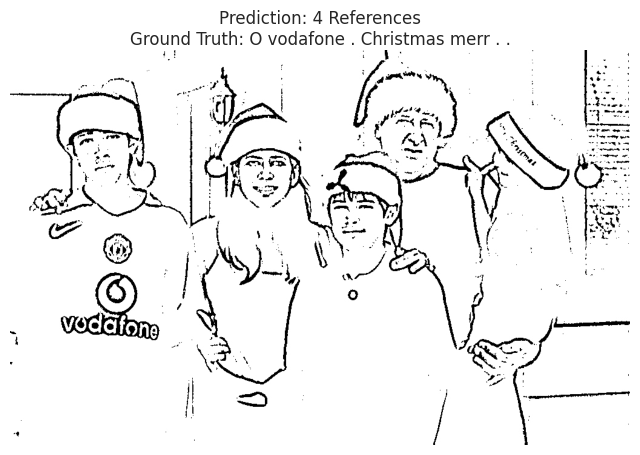

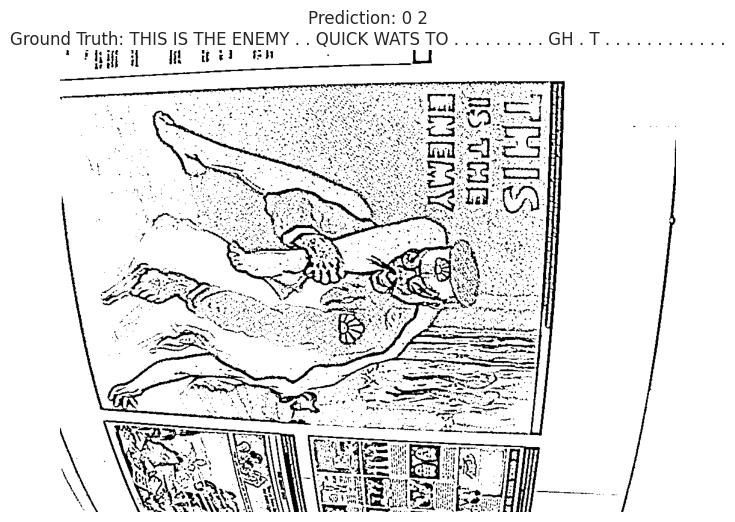

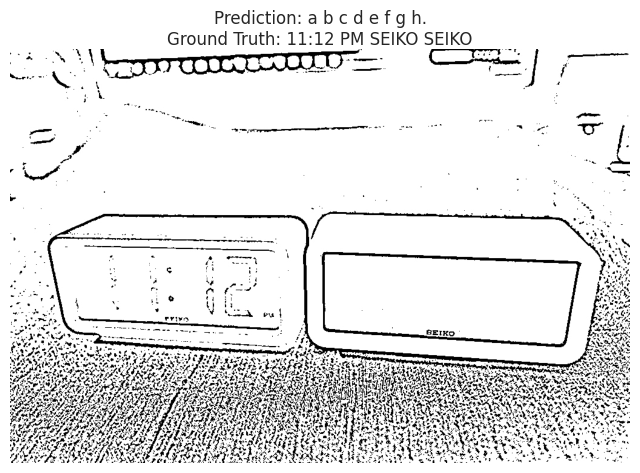

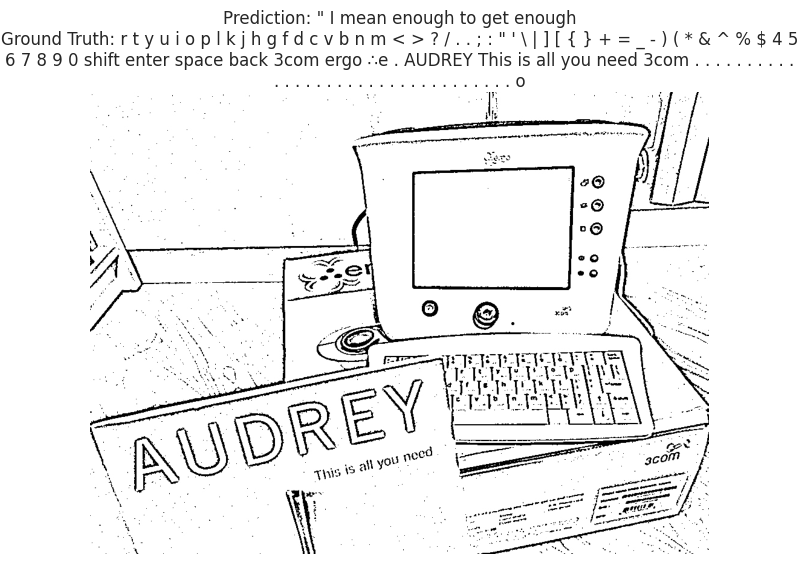

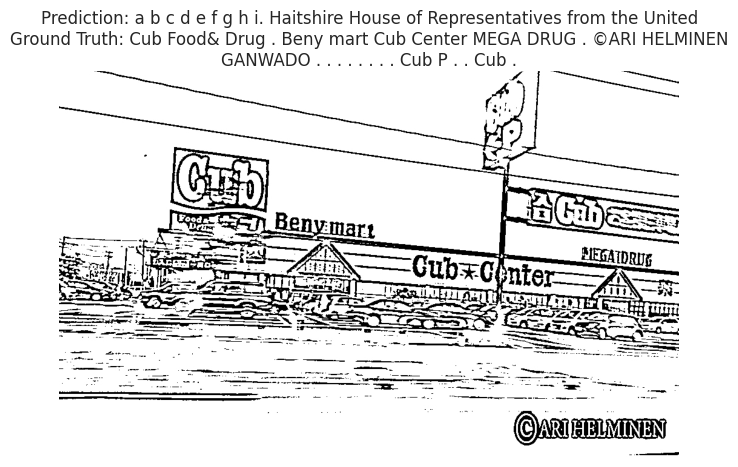

In [32]:
# Preprocess the test dataset for evaluation without modifying existing datasets
def preprocess_test_dataset(test_data, processor):
    """
    Add pixel_values and labels for the test dataset.
    """
    processed_data = []
    for sample in tqdm(test_data, desc="Preprocessing Test Dataset"):
        image = Image.open(sample["image_path"]).convert("RGB")
        pixel_values = processor(images=image, return_tensors="pt").pixel_values
        labels = processor.tokenizer(
            sample["text"], padding="max_length", max_length=128, truncation=True, return_tensors="pt"
        ).input_ids
        processed_data.append({
            "pixel_values": pixel_values.squeeze(0),
            "labels": labels.squeeze(0),
            "image_path": sample["image_path"]
        })
    return processed_data

# Process test dataset and create a DataLoader
print("Processing the test dataset for evaluation...")
processed_test_data = preprocess_test_dataset(dataset["test"], processor)

# Create a DataLoader for the processed test dataset
test_loader = DataLoader(processed_test_data, batch_size=batch_size)

# Evaluate and visualize
print("Evaluating and visualizing results...")
evaluate_and_visualize(test_loader, processor, model, num_samples=5)

*The evaluation results indicate that the TrOCR model struggles significantly with accurate text recognition on the test dataset. The Character Error Rate (CER) of 0.9751 and Word Error Rate (WER) of 1.0152 highlight that nearly all characters and words predicted by the model deviate from the ground truth. This poor performance suggests that the model's current configuration—be it preprocessing adjustments, feature extraction, or hyperparameter tuning—is insufficient for accurate text recognition. The visualization of predictions further confirms this, as the generated text often bears little resemblance to the annotated ground truth, underscoring the need for further refinement in training or preprocessing.*

### Text Detection Visualization Using TrOCR

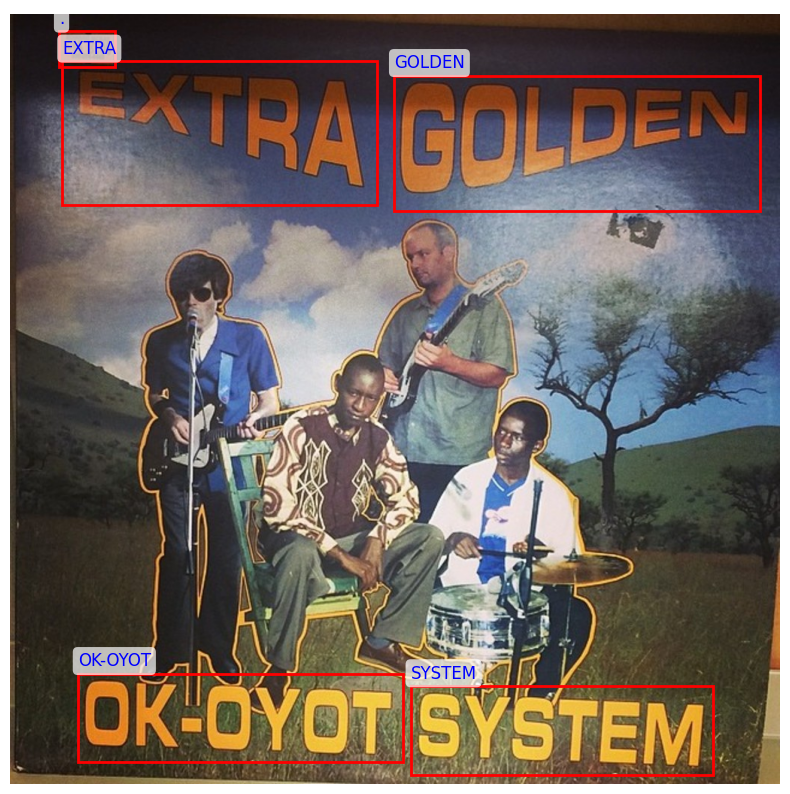

In [33]:
# Load Annotations (example: from parquet or JSON files)
annotation_file = "/content/unzipped_dataset/TextOCR_0.1_train.json"  # Adjust path as necessary
data_folder = "/content/unzipped_dataset/train_val_images/train_images"

# Load annotations from JSON
import json
with open(annotation_file, "r") as f:
    annotations = json.load(f)

# Select a sample image ID and path
sample_image_id = "f644219f560e3778"  # Replace with any valid image ID from your dataset
image_path = os.path.join(data_folder, f"{sample_image_id}.jpg")

# Get annotations for the selected image
image_annotations = [
    annotations["anns"][ann_id] for ann_id in annotations["imgToAnns"].get(sample_image_id, [])
]

# Define visualization function
def visualize_ground_truth(image_path, image_annotations):
    """
    Visualize the ground truth annotations (bounding boxes and text) on the image.
    """
    image = Image.open(image_path)
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.imshow(image)

    for annotation in image_annotations:
        bbox = annotation["bbox"]  # [x, y, width, height]
        text = annotation["utf8_string"]

        # Draw bounding box
        rect = patches.Rectangle(
            (bbox[0], bbox[1]), bbox[2], bbox[3], linewidth=2, edgecolor="red", facecolor="none"
        )
        ax.add_patch(rect)

        # Display text
        ax.text(
            bbox[0], bbox[1] - 10, text, fontsize=12, color="blue",
            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", boxstyle="round,pad=0.3")
        )

    plt.axis("off")
    plt.show()

# Visualize the sample image with annotations
visualize_ground_truth(image_path, image_annotations)

*This image displays the ground truth annotations for text detection, where red bounding boxes highlight the text regions, and blue labels indicate the corresponding recognized text such as "EXTRA," "GOLDEN," "OK-OYOT," and "SYSTEM." The visual demonstrates accurate alignment of bounding boxes with the textual content in the image, validating the effectiveness of the annotation process for OCR.*